In [12]:
using Revise, HarmonicBalance, Symbolics, DifferentialEquations, Plots, FFTW
using HarmonicBalance.TimeEvolution: FFT

# Driven damped harmonic oscillator

In this notebook, we focus on solving

\begin{equation}
\ddot{x}(t) + \gamma \dot{x}(t) + \omega_0^2 x(t) = F \cos(\omega t)
\end{equation}

### Solve the full equation in the time domain

This is an initial-value problem. We solve it using a Runge-Kutta type simulation from `DifferentialEquations.jl`.

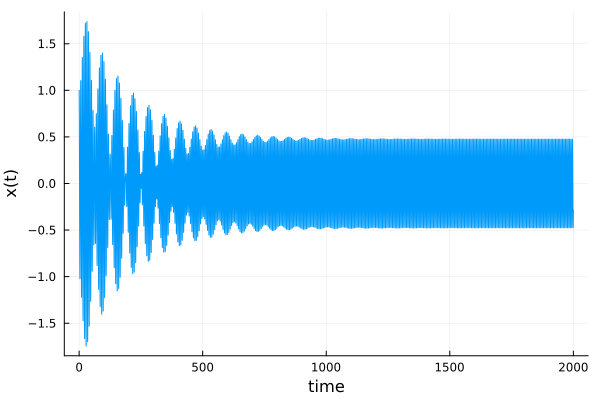

In [2]:
# time evolution function
function HO!(dx,x,fixed,t)
    dx[1] = x[2]
    dx[2] = -fixed[ω0]^2*x[1] - fixed[γ]*x[2] + fixed[F]*cos(fixed[ω]*t) 
end

x0 = [1.,0.] # initial condition
tspan = (0.0,2000.0) # timespan

@variables ω, ω0, F, t, γ # symbolic variables
fixed = Dict(ω0 => 1.0, γ => 0.01, F => 0.1,  ω => 1.1) # fixed parameters in the simulation 

prob = DifferentialEquations.ODEProblem(HO!,x0,tspan,fixed)
full_soln = solve(prob, saveat=0.01);

plot(full_soln.t , full_soln[1,:], xlabel="time", ylabel="x(t)", legend=false)

### Transform to harmonic equations, solve in slow time

\begin{equation}
x(t) = u_1(T) \cos(\omega t) + v_1(T) \sin(\omega t)
\end{equation}

The coordinate $T$ is known as _slow time_. Plugging this into our equation of motion and extracting the $\cos$ and $\sin$ components, we obtain the _harmonic equations_, 

\begin{equation}
\frac{d}{dT} \begin{pmatrix} u_1\\v_1\end{pmatrix} = \bar{G} (u_1, v_1)
\end{equation}

where we dropped second-order derivatives since we expect $u_1(T)$ and $v_1(T)$ to evolve slowly (_slow_flow_). 


This is a first-order ODE we can again solve with a Runge-Kutta type method.

In [7]:
# using HarmonicBalance.TimeEvolution: ODEProblem, DifferentialEquations.solve, FFT

In [3]:
@variables x(t) # declare a function x(t)

# differential equation
diff_eq = DifferentialEquation(d(x,t,2) + ω0^2*x + γ*d(x,t) ~ F*cos(ω*t), x)

# specify the ansatz x = u(T) cos(ωt) + v(T) sin(ωt)
add_harmonic!(diff_eq, x, ω)

harmonic_eq = get_harmonic_equations(diff_eq)

A set of 2 harmonic equations
Variables: u1(T), v1(T)
Parameters: γ, ω, ω0, F

Harmonic ansatz: 
x(t) = u1(T)*cos(ωt) + v1(T)*sin(ωt)

Harmonic equations:

γ*Differential(T)(u1(T)) + (ω0^2)*u1(T) + γ*ω*v1(T) + (2//1)*ω*Differential(T)(v1(T)) - (ω^2)*u1(T) ~ F

(ω0^2)*v1(T) + γ*Differential(T)(v1(T)) - (ω^2)*v1(T) - (2//1)*ω*Differential(T)(u1(T)) - γ*ω*u1(T) ~ 0


In [4]:
# inspect the standard form of the harmonic equations
HarmonicBalance.rearrange_standard(harmonic_eq).equations

2-element Vector{Equation}:
 ((ω0^2)*u1(T) + ((2//1)*ω*((ω0^2)*v1(T) + (2ω*((ω0^2)*u1(T) + γ*ω*v1(T) - F - (ω^2)*u1(T))) / γ - (ω^2)*v1(T) - γ*ω*u1(T))) / (((-4//1)*(ω^2)) / γ - γ) + γ*ω*v1(T) - F - (ω^2)*u1(T)) / (-γ) ~ Differential(T)(u1(T))
 ((ω0^2)*v1(T) + (2ω*((ω0^2)*u1(T) + γ*ω*v1(T) - F - (ω^2)*u1(T))) / γ - (ω^2)*v1(T) - γ*ω*u1(T)) / (((-4//1)*(ω^2)) / γ - γ) ~ Differential(T)(v1(T))

In [6]:
# cast as a differential equation problem again, solve
ode_problem = ODEProblem(harmonic_eq, fixed, x0 = x0, timespan = (0,2000))
time_evo = solve(ode_problem, saveat=0.1);

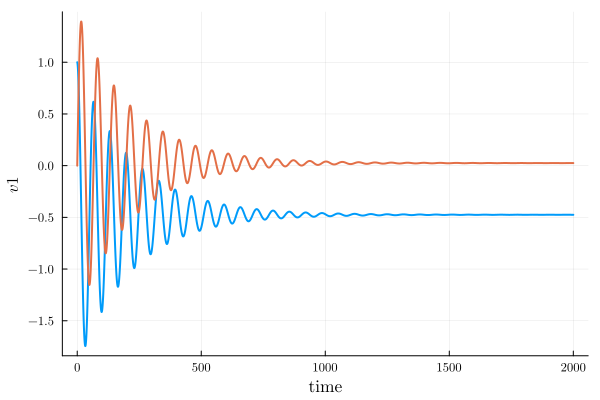

In [7]:
p1 = plot(time_evo, "u1", harmonic_eq)
plot!(time_evo, "v1", harmonic_eq) # overlay plot

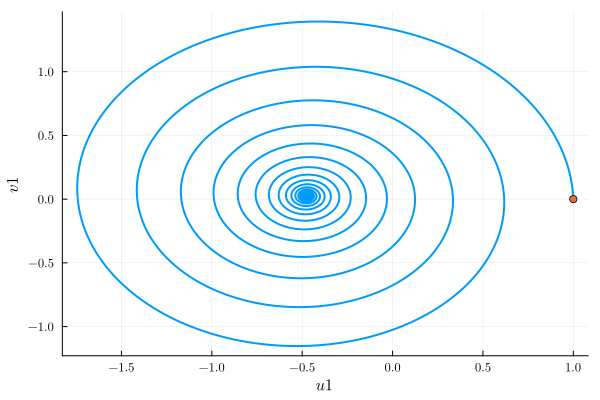

In [8]:
plot(time_evo, ["u1", "v1"], harmonic_eq, legend=false) # parametric plot
plot!([x0[1]],[x0[2]], markers=:true, line=false)

### transform back from u(T), v(T) to x(t)

We expect $x(t)$ to consist of two Fourier components
- $\omega$ : the drive
- $\omega_0$ : free time-evolution from the initial condition

In [9]:
times  = time_evo.t

# extract the u and v
u1 = transform_solutions(time_evo,"u1", harmonic_eq)
v1 = transform_solutions(time_evo,"v1", harmonic_eq)

# reconstruct x
x1 = u1.*cos.(fixed[ω]*times) .+ v1.*sin.(fixed[ω]*times);

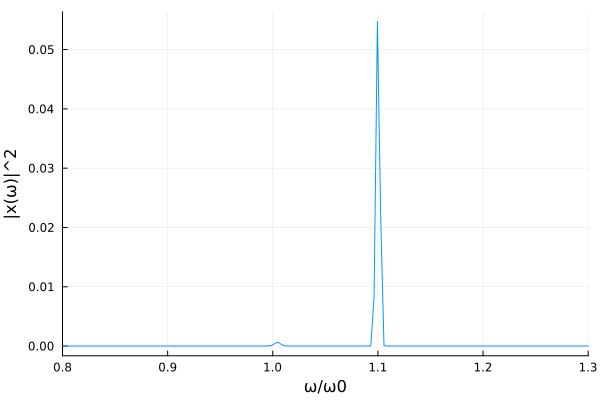

In [13]:
# Fourier transform
fft_x, freqs = FFT(x1,times)
plot(freqs, abs2.(fft_x[1]),xlim=[0.8,1.3],xlabel="ω/ω0",ylabel="|x(ω)|^2", legend=false)

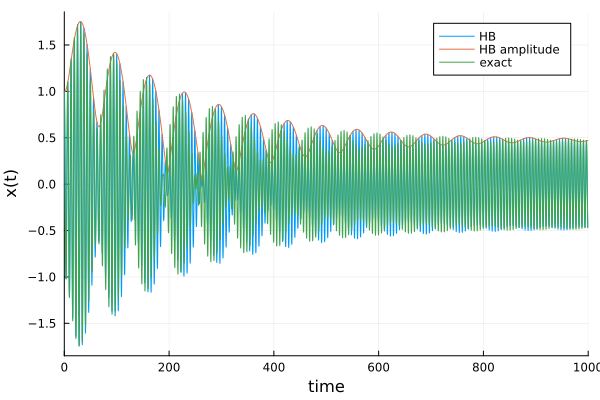

In [14]:
# from transient behaviour to a steady state
plot(times, x1, label="HB", xlabel="time", ylabel="x(t)")
plot!(times, sqrt.(u1.^2 + v1.^2), label="HB amplitude", xlabel="time")
plot!(full_soln.t, full_soln[1,:], label="exact", xlim=(0,1000))

### Steady state problem via HarmonicBalance.jl

Instead of solving an initial-value problem, we can look explicitly for steady states

$$
\frac{d}{dT} \begin{pmatrix} u_1\\v_1\end{pmatrix} = \bar{G}(u_1, v_1) = 0 \,.
$$

This is now an _algebraic_ equation. Since it is linear, it is easy to solve. We shall see this is rarely the case.

In [15]:
result_steady = get_steady_states(harmonic_eq, fixed)

A steady state result for 1 parameter points

Solution branches:   1
   of which real:    1
   of which stable:  1

Classes: stable, physical, Hopf, binary_labels


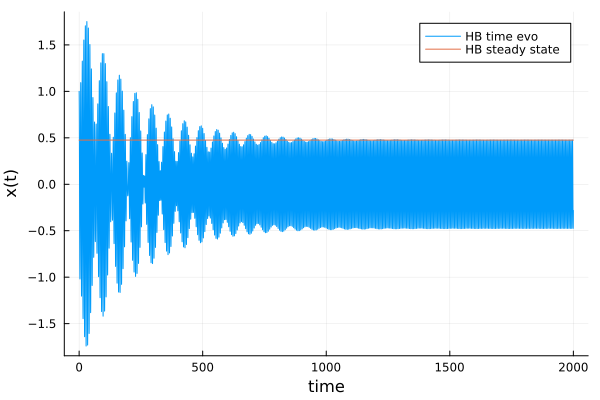

In [16]:
A_steady = transform_solutions(result_steady,"sqrt(u1^2+v1^2)")[1][1]

plot(times,x1,label="HB time evo",xlabel="time",ylabel="x(t)")
plot!(times, abs(A_steady) .* ones(length(times)),label="HB steady state")